# Insurance Claims- Fraud Detection
Problem Statement:
Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

 

Note: Use the link below to reach to your dataset. 




### DATA PREPARATION:
    - Importing data.
    - checking data for null values and irregularities if any.
    - Understanding Data.

In [334]:
#importing imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import warnings

plt.style.use('fivethirtyeight')
warnings.filterwarnings('ignore')

In [335]:
#Loading Data

train = pd.read_csv('insurance_fraud.csv')


In [336]:
train

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [337]:
train.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


### OBSERVATIONS:
    - months as a customer has zero minimum values. can be NAN as customer needs to have a legit value for being a customer.
    
    - _39 has NaN vlaues, drop this column
    

In [338]:
for i in train.columns:
    print('----------------------',i.upper(),'---------------------------')
    print(train[i].value_counts())

---------------------- MONTHS_AS_CUSTOMER ---------------------------
194    8
285    7
140    7
230    7
128    7
      ..
347    1
113    1
337    1
117    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
---------------------- AGE ---------------------------
43    49
39    48
41    45
34    44
30    42
31    42
38    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
36    32
42    32
44    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
25    14
49    14
55    14
50    13
53    13
61    10
24    10
54    10
60     9
51     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
22     1
20     1
19     1
Name: age, dtype: int64
---------------------- POLICY_NUMBER ---------------------------
116735    1
107181    1
430794    1
115399    1
328387    1
         ..
218456    1
179538    1
357713    1
247116    1
296960    1
Name: policy_number, Length: 1000, dtype: int64
---------------------- POLICY_BIND_DATE -

#### OBSERVATIONS:
    - as 0 months as customer zero values is only 1 , we can drop it.
    - policy_number is unique for all the data. we can drop the feature.
    - policy bind date, incident_date are Dates we can extract the month, day , year.
    
    - umbrella limit has maximum count of 0.
    - collision Type, property damage, police_report_available has ? values, missing vlaues.
    - incidetn location is text, we can extract other data from it.

In [339]:
# dropping _c39, policy_number

train.drop(['_c39','policy_number'],axis=1,inplace=True)

In [340]:
# filling ? with Nan Values

train['police_report_available'] = train['police_report_available'].apply(lambda x: np.NaN if x=='?' else x)
train['property_damage'] = train['property_damage'].apply(lambda x: np.NaN if x=='?' else x)
train['collision_type'] = train['collision_type'].apply(lambda x: np.NaN if x=='?' else x)


In [341]:
train.isnull().sum(axis=0)

months_as_customer               0
age                              0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries                  0
witnesses           



#### VISIUALIZING TARGET CLASS

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

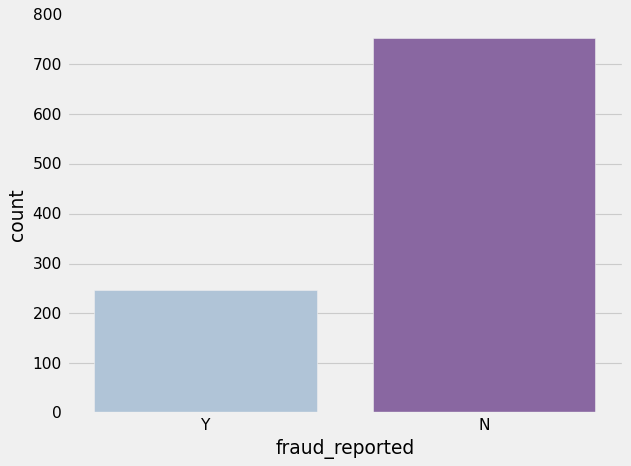

In [342]:
sb.countplot(train['fraud_reported'],palette='BuPu')

#### IMBLANCED CLASSES NOTICED
    - WE will do over sampling to have a better visualization .

### FEATURE RE ENGINNERING BEFORE EDA :
    - Extracting Date 

In [343]:
# converting incident_date, policy_bind date into datetime object
train['incident_date'] = pd.to_datetime(train['incident_date'])
train['policy_bind_date'] = pd.to_datetime(train['policy_bind_date'])

# extracting day,year,month from the dates

train['incident_date_year'] = train['incident_date'].apply(lambda x: x.year)
train['incident_date_month'] = train['incident_date'].apply(lambda x: x.month)
train['incident_date_day'] = train['incident_date'].apply(lambda x: x.day)

train['policy_bind_month'] = train['policy_bind_date'].apply(lambda x: x.month)
train['policy_bind_day'] = train['policy_bind_date'].apply(lambda x: x.day)
train['policy_bind_year'] = train['policy_bind_date'].apply(lambda x: x.year)

In [344]:
# droping datetime objects after extracting month,year,day from dates

train.drop(['policy_bind_date','incident_date'],inplace=True,axis=1)

## oversampling for EDA

In [345]:
from imblearn.over_sampling import RandomOverSampler

In [346]:
x = train.drop('fraud_reported',axis=1)
y = train['fraud_reported']

In [347]:
#oversampling the Data
x_over,y_over = RandomOverSampler().fit_resample(x,y)

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

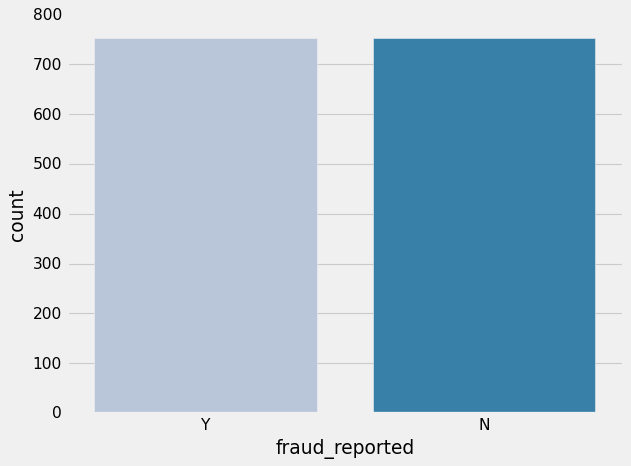

In [348]:
#Countplot of Target Variable.
sb.countplot(y_over,palette='PuBu')


##### BALANCED TARGET CLASSES AFTER OVER SAMPLING FOR BETTER VIZUALIZATION INSIGHTS

In [349]:
## Column segregation between continous , categorical feature

categorical_col = ['policy_state','policy_csl','policy_deductable','umbrella_limit',
                   'insured_sex','insured_education_level','insured_occupation',
                   'insured_hobbies','insured_relationship','incident_type',
                   'collision_type','incident_severity','authorities_contacted','incident_state','incident_city'
                  ,'incident_hour_of_the_day','number_of_vehicles_involved','property_damage','bodily_injuries',
                  'witnesses','police_report_available','incident_date_year', 'incident_date_month',
                   'incident_date_day', 'policy_bind_month', 'policy_bind_day',
       'policy_bind_year', 'auto_make','auto_model','auto_year']
continous_features = ['months_as_customer','age','policy_annual_premium','capital-gains'
                     ,'capital-loss','total_claim_amount','injury_claim','property_claim','vehicle_claim']
misc = ['insured_zip','incident_location']

#### Vizualizing continous features.

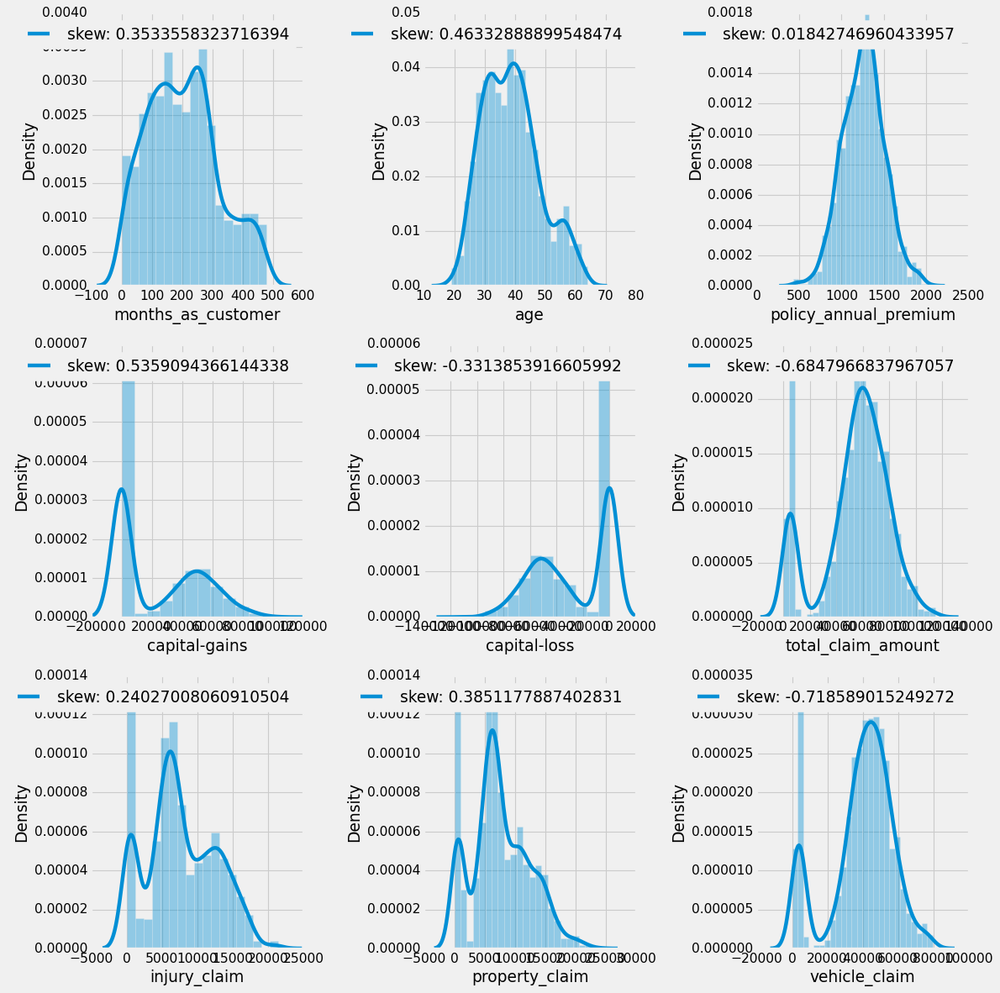

In [350]:
# Distribution Plots

plt.figure(figsize=(15,15))
c=1
for i in continous_features:
   

    plt.subplot(3,3,c)
    c=c+1
    sb.distplot(x_over[i])
    plt.legend(['skew: '+str(x_over[i].skew())])
plt.tight_layout()

#### OBSERVATIONS:
    - Al the continous variables follow gaussian like structure/ Normal Distribution , some features have a low skewness present, which can be removed with outlier removal or other form of standardization or scaling techniques.

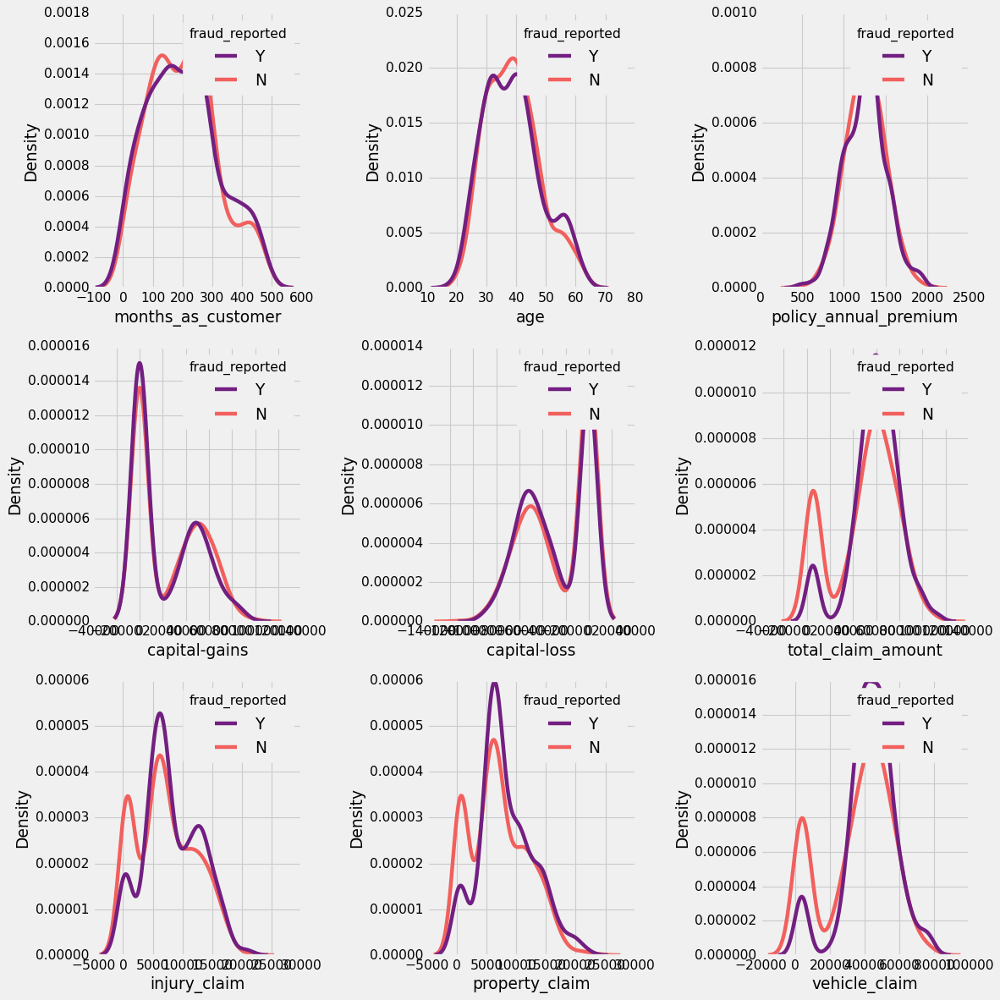

In [351]:
# Distribution Plots

plt.figure(figsize=(15,15))
c=1
for i in continous_features:
   

    plt.subplot(3,3,c)
    c=c+1
    sb.kdeplot(x_over[i],hue=y_over,palette='magma')
plt.tight_layout()

### OBSERVATIONS:
    - Distribution of all the distribution plots w.r.t to the Fraud_reported Yes/ No
    - Some features like vehicle Claim ,property claims, injury claims,total claim amount  have significant differential boundaries. where as other features like Captital-gain,loss, age, months of customer,annual premium have donot have significatn boundary differentiation telling is less influence on Target Variable.
    
    
  ##### VISUALIZATION of Vehicle Claim , property claims, injury claims, total claim amount  to Understand Trend with Fraud_reported

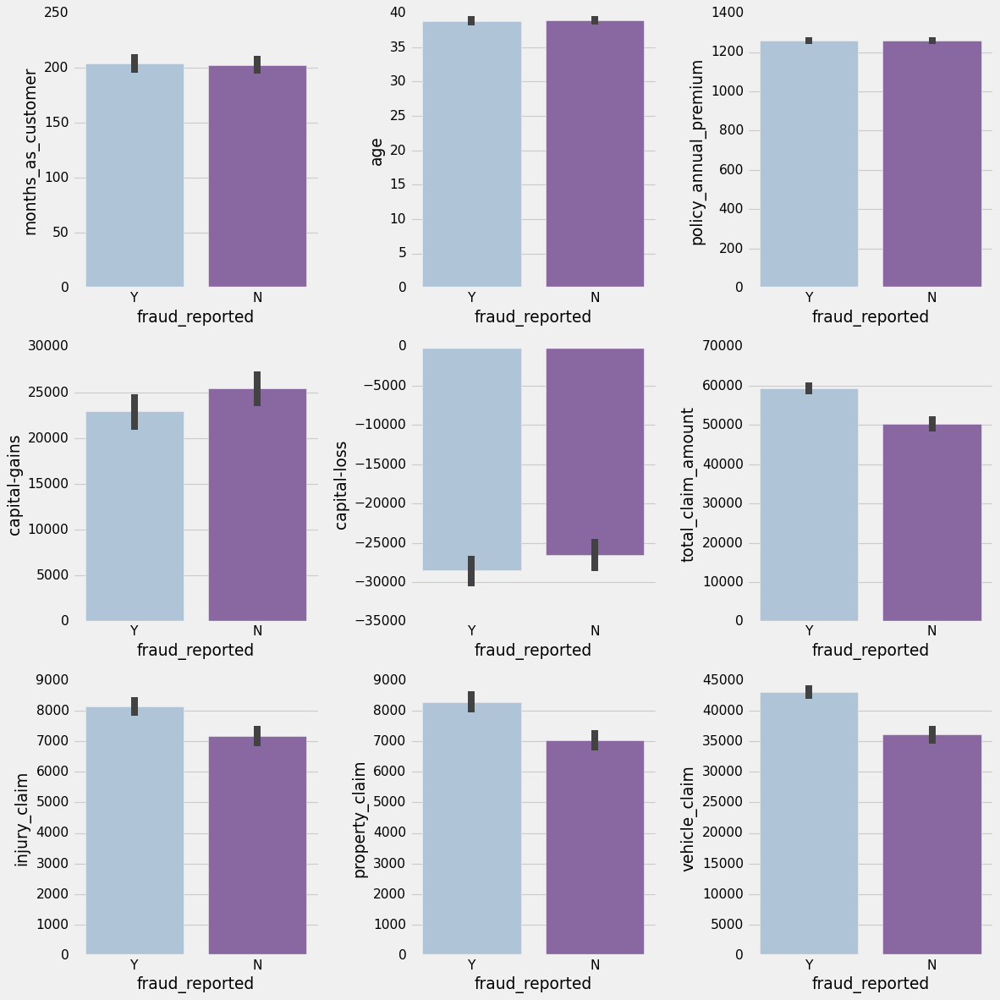

In [352]:
# Distribution Plots

plt.figure(figsize=(15,15))
c=1
for i in continous_features:
   

    plt.subplot(3,3,c)
    c=c+1
    sb.barplot(y_over,x_over[i],palette='BuPu')
plt.tight_layout()

#### OBSERVATIONS:
    - WE can observe average value same in Captital-gain,loss, age, months of customer,annual premium .
    - Major difference in average mean value in claim values.

<AxesSubplot:xlabel='total_claim_amount', ylabel='vehicle_claim'>

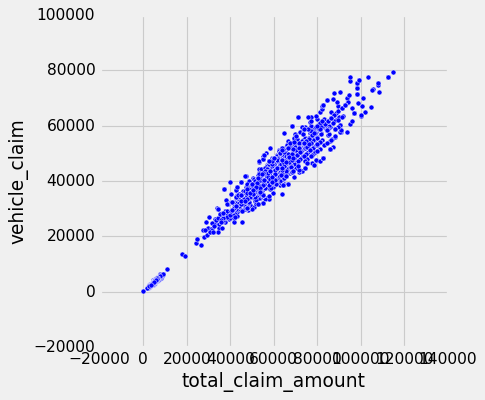

In [353]:
# Distribution Plots
plt.figure(figsize=(5,5))

sb.scatterplot(x_over['total_claim_amount'],x_over['vehicle_claim'],palette='pastel')




#### Total Clain amount and Vehical claim has linear relationship

<Figure size 400x400 with 0 Axes>

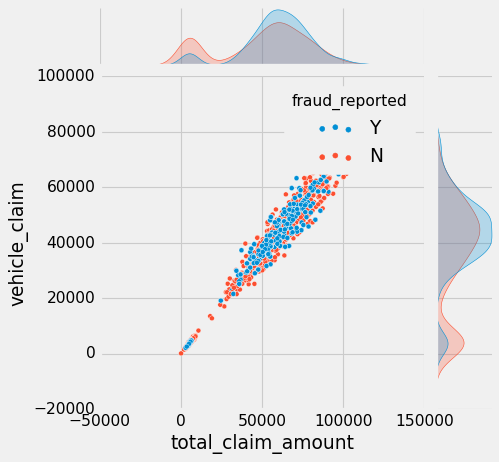

In [354]:
# Distribution Plots
plt.figure(figsize=(5,5))

sb.jointplot(x_over['total_claim_amount'],x_over['vehicle_claim'],hue=y_over)




#### NOTE: For higher vlaue of Total claim amount and high vehical claim, Fruad Report yes is also increasing.

<Figure size 400x400 with 0 Axes>

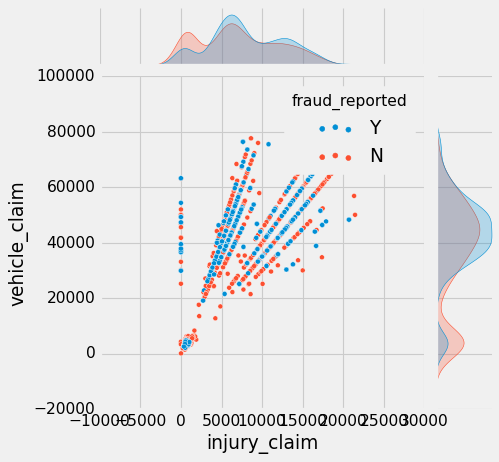

In [355]:
# Distribution Plots
plt.figure(figsize=(5,5))

sb.jointplot(x_over['injury_claim'],x_over['vehicle_claim'],hue=y_over)




###### Fraud YEs/ No are scattered evenly.

<Figure size 400x400 with 0 Axes>

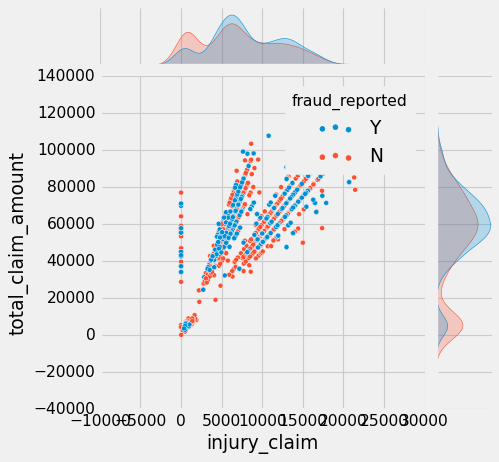

In [356]:
# Distribution Plots
plt.figure(figsize=(5,5))

sb.jointplot(x_over['injury_claim'],x_over['total_claim_amount'],hue=y_over)




### NOTE:
    - Fraud Yes is are concentrated for lower injury claims and Higher total claim amounts.

<Figure size 400x400 with 0 Axes>

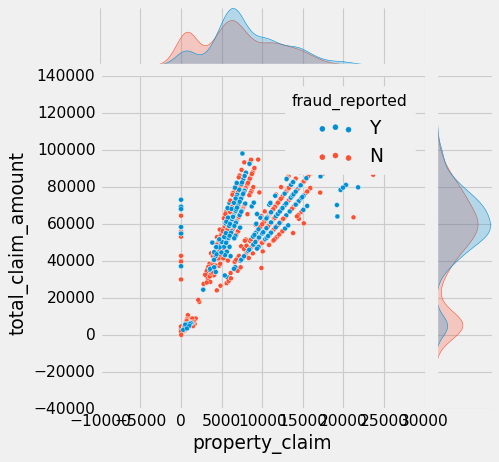

In [357]:
# Distribution Plots
plt.figure(figsize=(5,5))

sb.jointplot(x_over['property_claim'],x_over['total_claim_amount'],hue=y_over)




#### NOTE:
    - No fraud is concentrated or lower values for property claim and higher vlaue of total claim/ high property claim is concentrated with YES Fraud.

<AxesSubplot:xlabel='capital-gains', ylabel='fraud_reported'>

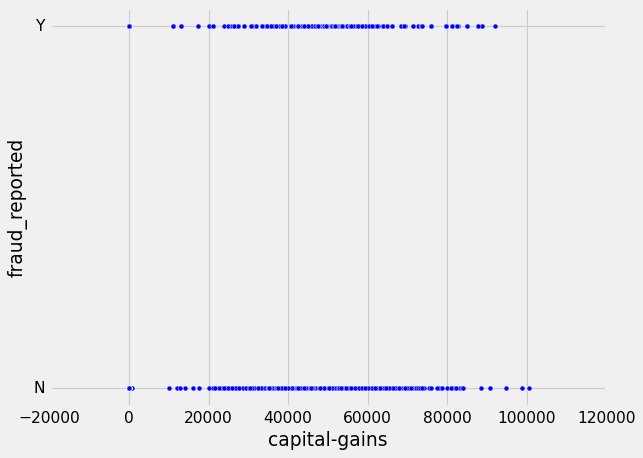

In [358]:
sb.scatterplot(x_over['capital-gains'],y_over)

<AxesSubplot:xlabel='capital-loss', ylabel='fraud_reported'>

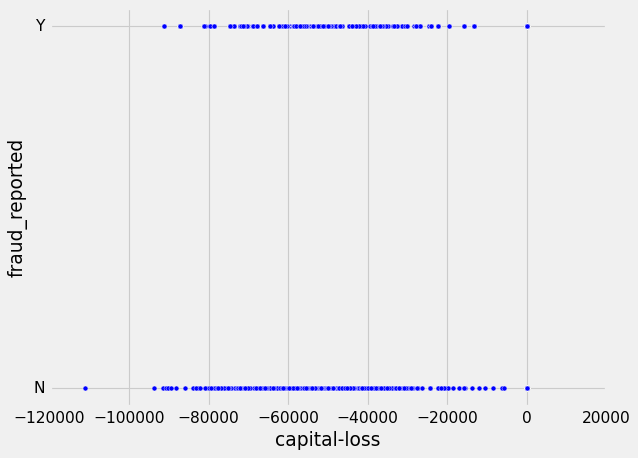

In [359]:
sb.scatterplot(x_over['capital-loss'],y_over)

#### Evenly scattered data for both fraud YES, No

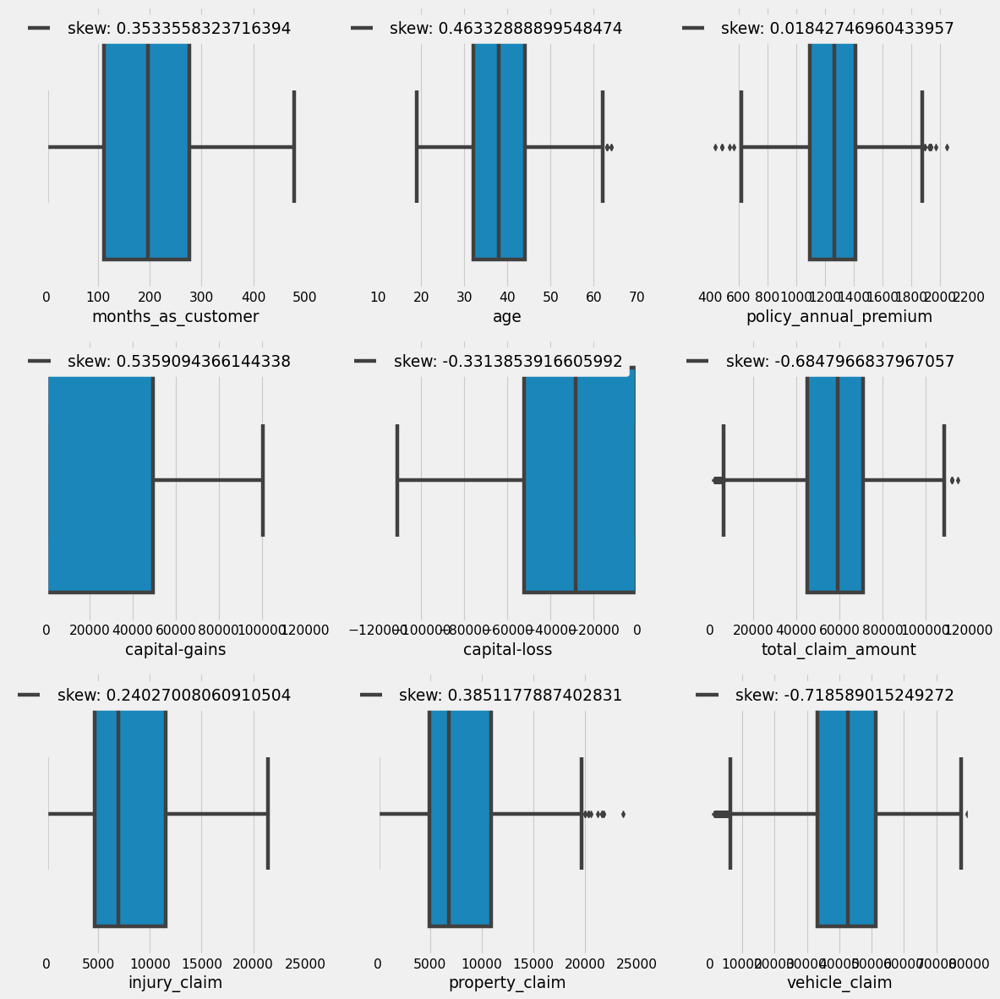

In [360]:
# Distribution Plots

plt.figure(figsize=(15,15))
c=1
for i in continous_features:
   

    plt.subplot(3,3,c)
    c=c+1
    sb.boxplot(x_over[i])
    plt.legend(['skew: '+str(x_over[i].skew())])
plt.tight_layout()

### Low number of Outliers Noticed.

### EDA OF CATEGORICAL FEATURES

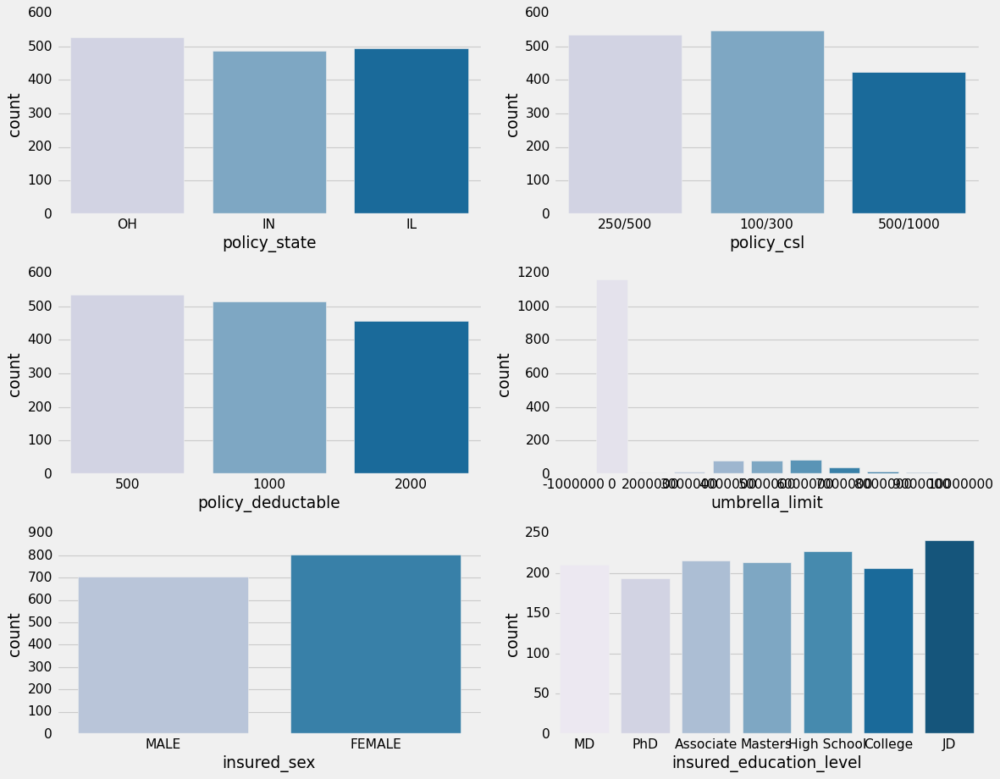

In [361]:
# Distribution Plots

plt.figure(figsize=(15,15))
c=1
for i in categorical_col[:6]:
   

    plt.subplot(4,2,c)
    c=c+1
    sb.countplot(x_over[i],palette='PuBu')
    
plt.tight_layout()

#### OBSERVATIONS:
    - insured_education_level with High School, JD has Highest count.
    - policy deductable 200 lowest, other same range
    - Umbrella limit 0 highest count of rows.
    -Policy State has highest count in OH

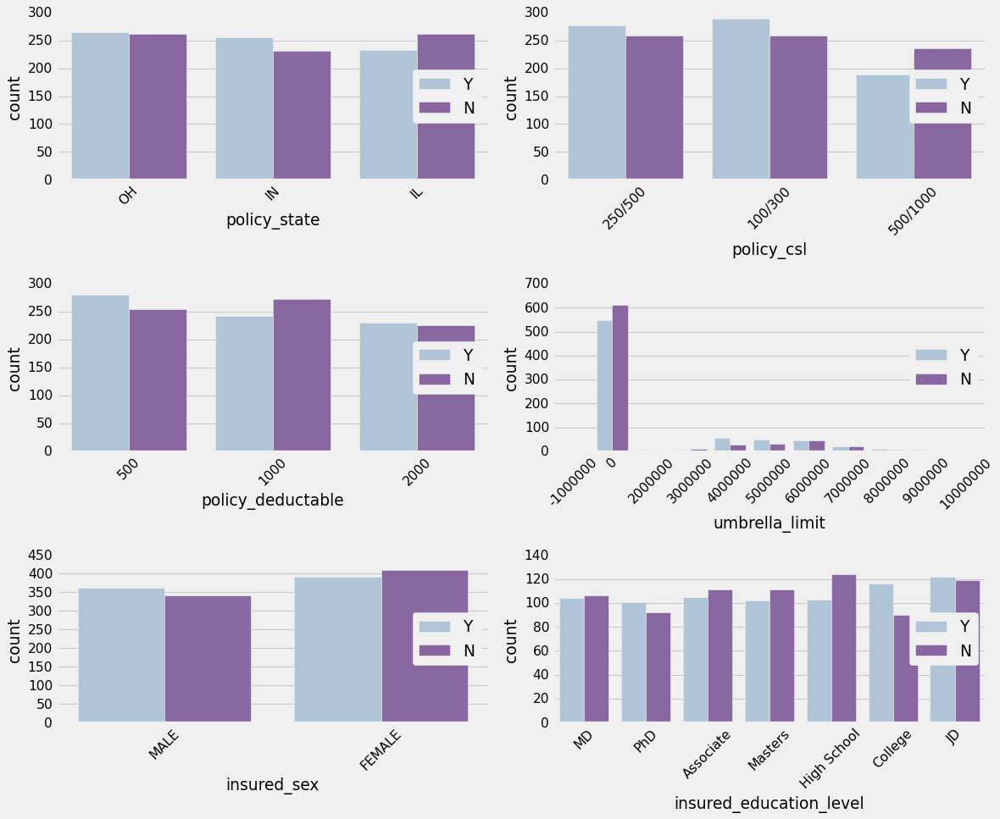

In [362]:
# Distribution Plots

plt.figure(figsize=(15,15))
c=1
for i in categorical_col[:6]:
   

    plt.subplot(4,2,c)
    c=c+1
    sb.countplot(x_over[i],palette='BuPu',hue=y_over)
    plt.xticks(rotation=45)
    plt.legend(loc=5)
plt.tight_layout()

#### OBSERVATIONS:
    - insured_sex has correlation qith Fraus_reported as in Male, Yes fraud is high, and in Female probability of No is higher. Less difference but difference is present.
    - in insured_education level Masters has highest probability for No Fraud., College, MD has high probability for Yes Fraud. Associate has equal probability for yes/ no fraud.
    - policy csl, 250/500 has high probability for Yes fraud, 500/1000 has high probabiltiy for No fraud.
    -IL policy State has high probability fro No fraud, where IN has high probability for Yes Fraud.
    - Highest cuont of Yes/No  fraud lies in 0 umbrella limit and probabiltiy of No is higher.

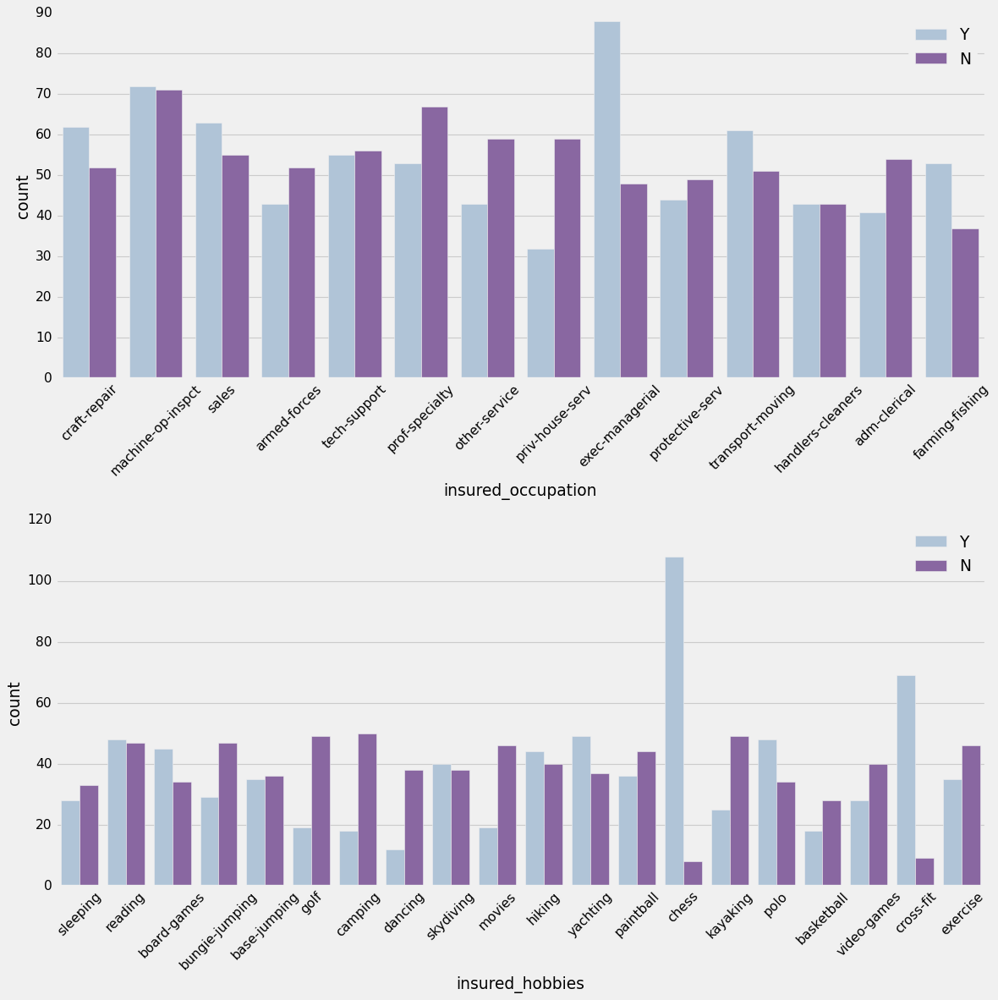

In [363]:


plt.figure(figsize=(15,15))
c=1
for i in categorical_col[6:8]:
   

    plt.subplot(2,1,c)
    c=c+1
    sb.countplot(x_over[i],palette='BuPu',hue=y_over)
    plt.xticks(rotation=45)
    plt.legend(loc=1)
plt.tight_layout()

#### OBSERVATION:

    INSURED HOBBIES 
    
    - insured_hobbies with Chess, cross-fit has like 80% probaibltiy to belong in Yes Fraud Reported.
    - more than 60% probabilty to belong in No fraud is with Camping,dancing, golf,kayaking,exercise.
    - yatching, reading hS LIKE 60% PROBABILTY TO Yes fraud.
    
    INSURED_ OCCUPATION:
    - exec- manegerial, craft repair, sales, tech-support, transport moving and farming has more than 65% probabiltiy to belnog in YES FRAUD.
    - EXEC-Manegerial has more than 90% probability to belong in YES FRAUD.
    - Armed forces, machine-opt-inspct , prof-speciality,adm clerical has more than 60% prob to belnog in No Fraud.

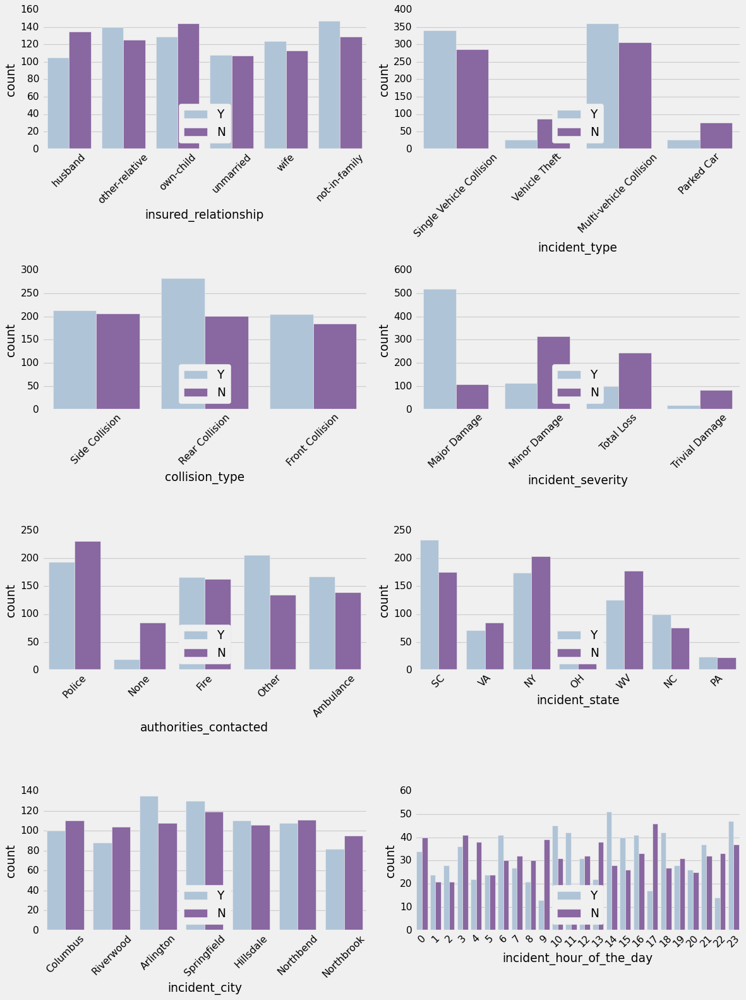

In [364]:

plt.figure(figsize=(15,20))
counter=1
for i in categorical_col[8:16]:
   

    plt.subplot(4,2,counter)
    counter = counter + 1
    sb.countplot(x_over[i],palette='BuPu',hue=y_over)
    plt.xticks(rotation=45)
    plt.legend(loc=8)
plt.tight_layout()

#### OBSERVATIONS:
    - incident_city arlington has around 65% probability to belong in Yes Fraud. Riverwood, NorthBend, NorthBrook has 60% probability to belong in No Fraud.
    - Incident Hour of the Day 10,18 14,15,16 has mroe than 70-% probability to belong in YES Fraud.
    - 13,7,9,17,21,22 has high probability to belong in No Fraud. No pattern observed like with increase hourdays and count.
    - authorities contacted with police has high probability of No Fraud, None has arounf 85% + probabiltiy to belong in No Fraud. others, ambulance , Fire has high probability of Yes Fraud.
    - incident_state SC, NC has high probability of Yes fraud. NY , wV has high prb ability for No Fraud.
    - Collion type with Rear has highest probility of YES fraud.
    - Incident Severity with Major Severity  has 85% +  probability to belong in YES fraud. Minor Damage, Trivial Damage, total loss has more than 70% prbability to belong in NO Fraud. Strong Correlation noticed.
    - insured_relationship other relatve, not in familty has higher probability of Fraud Yes. own child husband No fraud higher probability.
    - Single vehicle, multi vehicle collision has higher probabiltiy of Yes fruad. Vehical theft and parked Card has more than 75% probabilty to belong in No Fraud.

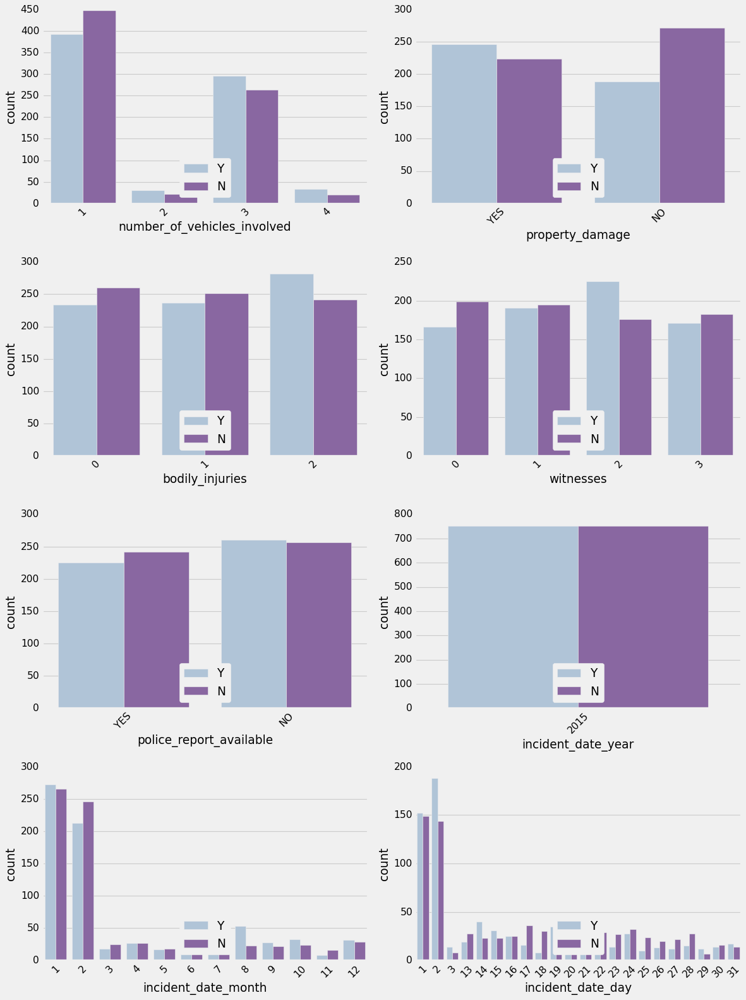

In [365]:

plt.figure(figsize=(15,20))
counter=1
for i in categorical_col[16:24]:
   

    plt.subplot(4,2,counter)
    counter = counter + 1
    sb.countplot(x_over[i],palette='BuPu',hue=y_over)
    plt.xticks(rotation=45)
    plt.legend(loc=8)
plt.tight_layout()

#### OBSERVATIONS:
    - Property Damage has a correlation with the Fraud as No property damage, has higher probability(60-65%) of No Fraud. And Yes property Damage has higher(55%) probability of Yes Fraud.
    - no_vehicles involves doesnot show any pattern. Same probability.
    - Bodily injuries 1 has higher No Fraud Probability and 2 bodily injuries has higher Yes fraud probability.
    - Witnesses 2 has High 65% probabiltiy of Yes fruad, 0  has high probability of No fraud.
    - police report available doesnot have any particular distinction of probability of Fraud .  Yes Report has higher prob for No Fraud.
    - incident_date_year can be omited as all the data are from 2015.
    - icident month Has highest count in mnoth 1,2 and mnoth 1 has higher YEs fraud Probabiltiy and month 2 has higher No Fraud probability. Month 8 has 70% + prbabilitty to belong in YES Fraud.
    - incident Date has highest count for day 1,2 both have high probaiblity for Yes Fraud. 
    

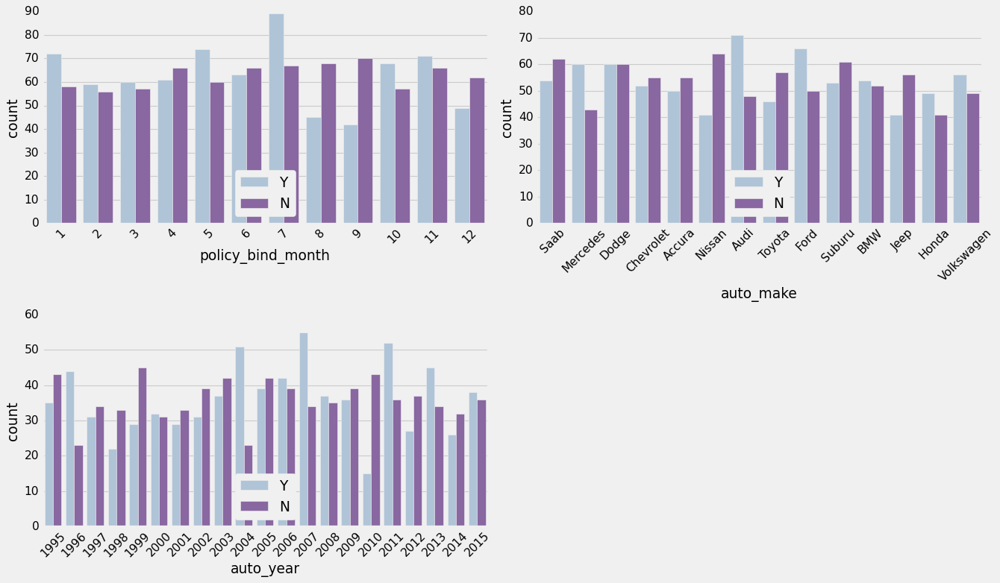

In [366]:

plt.figure(figsize=(17,10))
counter=1
for i in ['policy_bind_month','auto_make','auto_year']:
   

    plt.subplot(2,2,counter)
    counter = counter + 1
    sb.countplot(x_over[i],palette='BuPu',hue=y_over)
    plt.xticks(rotation=45)
    plt.legend(loc=8)
plt.tight_layout()

#### OBSERVATIONS:
    - Auto year 1996,2004 has more than 80% probability to belong in Yes Fraud. Auto Year 1999,2015,2010 has 65% probaiblity to bleong to No fraud.  Year 2013,2011,2007 has high prbabiltiy towards Yes Fraud.
    - Mercedes, Volswagon, BMW, audi has higher Fraud Probability, Whereas Nissan, Jeep, Accura, Toyota has high probabiltiy toward no fraud.
    - policy bind month 7 has has highest probability towards Yes Fraud. Lower value of month have higher probabiltiy toward fraud occurence and higher vlaue of mnoths have higher probability towards no fraud.

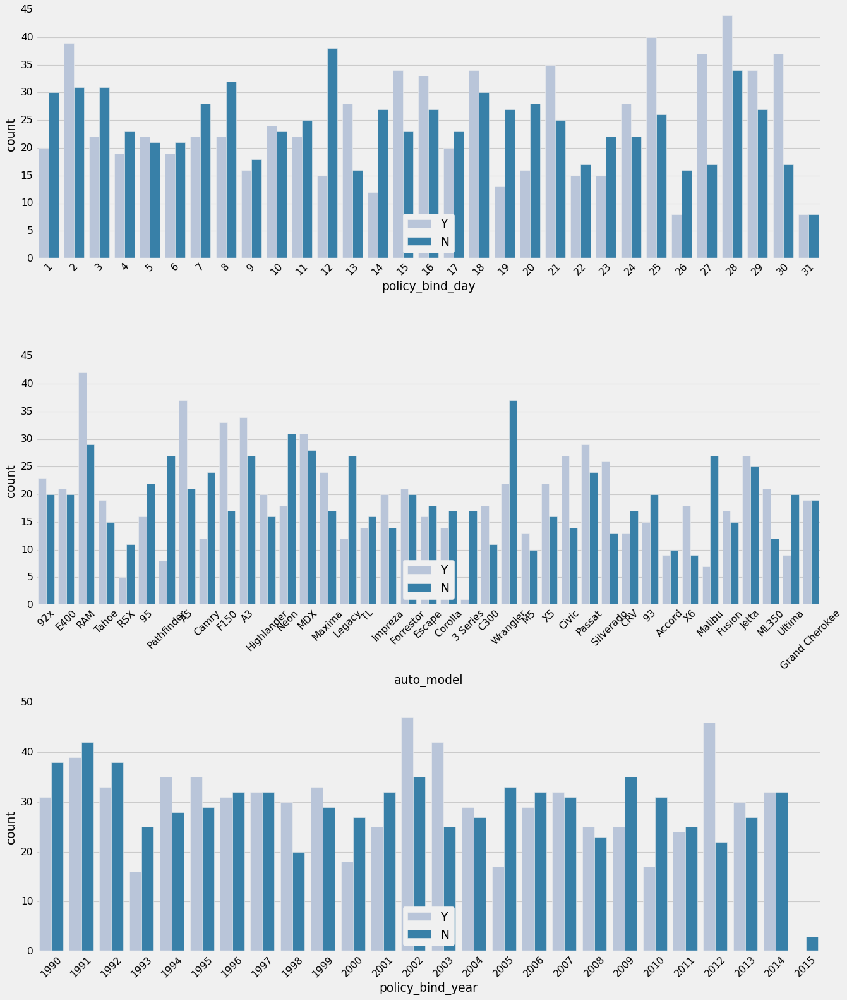

In [367]:

plt.figure(figsize=(17,20))
counter=1
for i in ['policy_bind_day','auto_model','policy_bind_year']:
   

    plt.subplot(3,1,counter)
    counter = counter + 1
    sb.countplot(x_over[i],palette='PuBu',hue=y_over)
    plt.xticks(rotation=45)
    plt.legend(loc=8)
plt.tight_layout()

#### OBSERVATIONS:
    - policy_bind_year has highest probabily towards 2002,2012. 
    - in 2015 No fraud occurred.
     
    - Auto model with RAM,a5, F150,C300, Passat, Silverando, X6, ML 350 has more than 65% probabilty to belong in yes fraud.
    - Wrangler,malibu, Highlander has more than 75% to belong in No Fraud .
    - For high policy day number, high prbabilty towards yEs fraud for day 27,28,29,30,31.

In [368]:
fraud_y = y_over.apply(lambda x: 1 if x=='Y' else 0)

#### Data Cleaning:
    - Filling the missing Values,
    - labeling the categorcial data.
    - Feature RE Engineering

In [369]:
train.isnull().sum(axis=0)

months_as_customer               0
age                              0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries                  0
witnesses                        0
police_report_available        343
total_claim_amount  

In [370]:
train['property_damage'] = train['property_damage'].fillna(train['property_damage'].mode()[0])
train['collision_type'] = train['collision_type'].fillna(train['collision_type'].mode()[0])
train['police_report_available'] = train['police_report_available'].fillna(train['police_report_available'].mode()[0])

In [371]:
train.isnull().sum(axis=0)

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_c

In [372]:
from sklearn.preprocessing import LabelEncoder

In [373]:
# Dropping incident date year

train.drop('incident_date_year',axis=1,inplace=True)

In [374]:
categorical_col.remove('incident_date_year')

In [375]:
for i in categorical_col:
    train[i] = LabelEncoder().fit_transform(train[i])

In [376]:
train['fraud_reported']= LabelEncoder().fit_transform(train['fraud_reported'])

In [377]:
train['incident_area'] = train['incident_location'].apply(lambda x:x.split()[-1])

In [378]:
train['incident_area'].value_counts()

Drive    173
St       171
Ridge    171
Lane     171
Ave      161
Hwy      153
Name: incident_area, dtype: int64

<AxesSubplot:xlabel='incident_area', ylabel='count'>

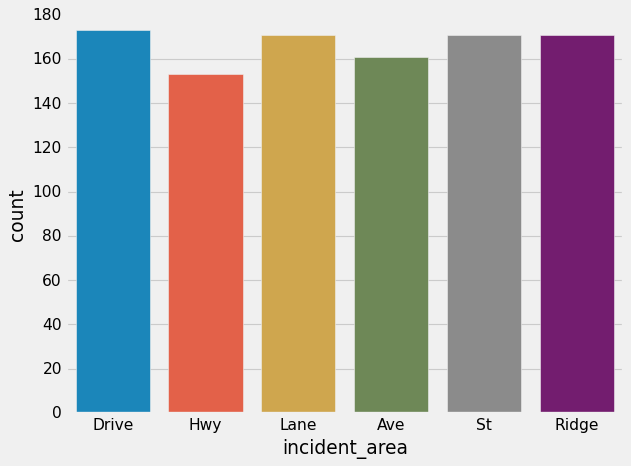

In [379]:
sb.countplot(train['incident_area'])

<AxesSubplot:xlabel='incident_area', ylabel='count'>

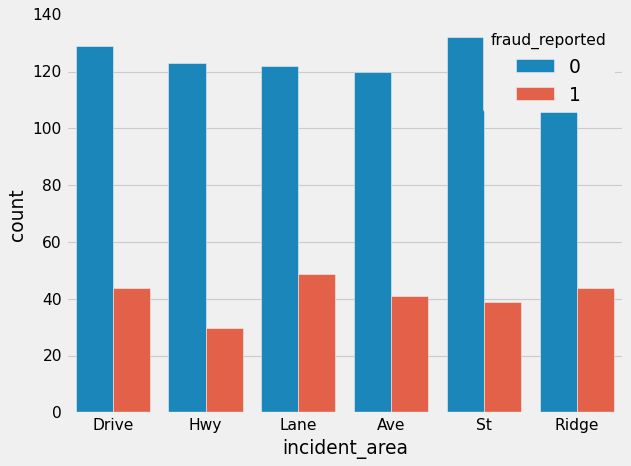

In [380]:
sb.countplot(train['incident_area'],hue=train['fraud_reported'])

#### OBSERVATIONS:
    - IN Fraud Reported, lane has Slightly highest probability.
    - in No Fraud, St has highest probability.

In [381]:
train['incident_area']= LabelEncoder().fit_transform(train['incident_area'])

In [382]:
train.drop('incident_location',axis=1,inplace=True)

### OUTLER TREATMENT WITH ZSCORE

In [383]:
from scipy.stats import zscore

In [384]:
zscores = np.abs(zscore(train))

In [385]:
np.where(zscores>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 807, 875, 922, 975], dtype=int64),
 array([ 6,  6,  6,  6,  6,  5,  5,  6,  6,  6,  6, 29,  6,  6,  6,  5, 14,
         6,  6,  6], dtype=int64))

In [386]:
train = train [(zscores<3).all(axis=1)]

In [387]:
train.shape

(980, 41)

### 2 %  Data Loss

In [388]:
train[continous_features].skew()

months_as_customer       0.362608
age                      0.475385
policy_annual_premium    0.035964
capital-gains            0.466619
capital-loss            -0.376884
total_claim_amount      -0.593593
injury_claim             0.271759
property_claim           0.361356
vehicle_claim           -0.620936
dtype: float64

#### By  using sqrt, log, cbrt transformations, skewness is increasing rather than decresing, as the skewness is not that high we can leave it.

#### Scaling the Continous variables

In [389]:
from sklearn.preprocessing import PowerTransformer

In [390]:
train[continous_features] = PowerTransformer().fit_transform( train[continous_features]  )

In [391]:
train[continous_features].skew()

months_as_customer      -0.133972
age                     -0.002183
policy_annual_premium   -0.007258
capital-gains            0.031294
capital-loss             0.088750
total_claim_amount      -0.508540
injury_claim            -0.416732
property_claim          -0.357397
vehicle_claim           -0.521805
dtype: float64

In [392]:
train.drop('insured_zip',axis=1,inplace=True)

# Multivariante Analysis

<AxesSubplot:>

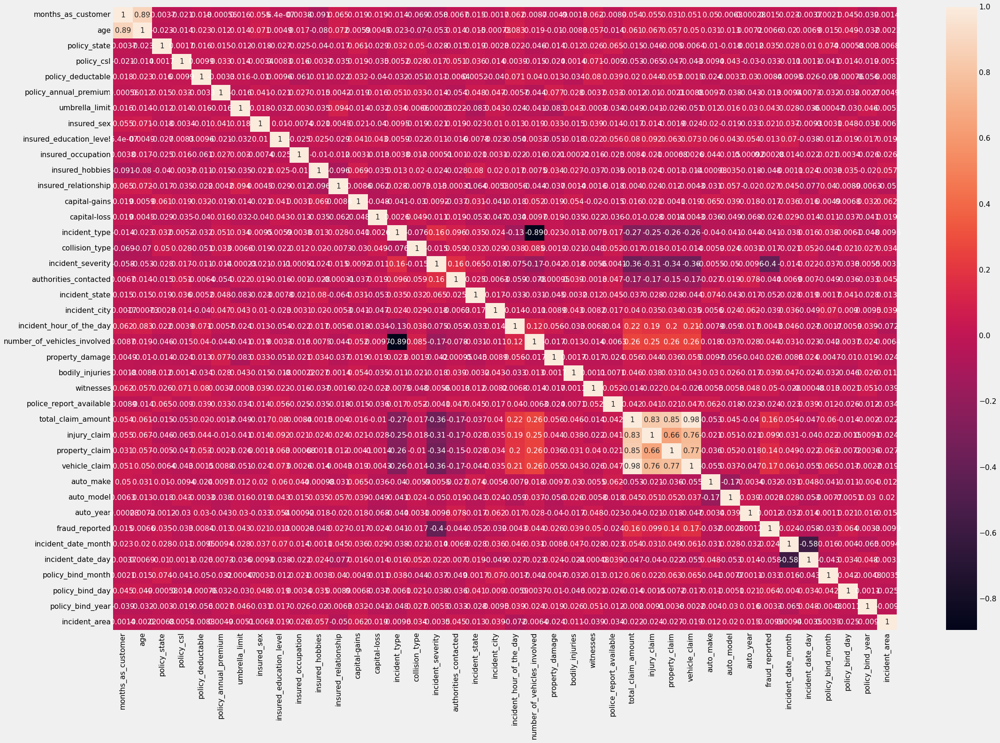

In [393]:
plt.figure(figsize=(30,20))
sb.heatmap(train.corr(),annot=True)

###### OBSERVATIONS:
     - Fraud Reported have moderate correlation with total claims and all different types of claims.
     -Fraud Reported has negative corelation with incident severity

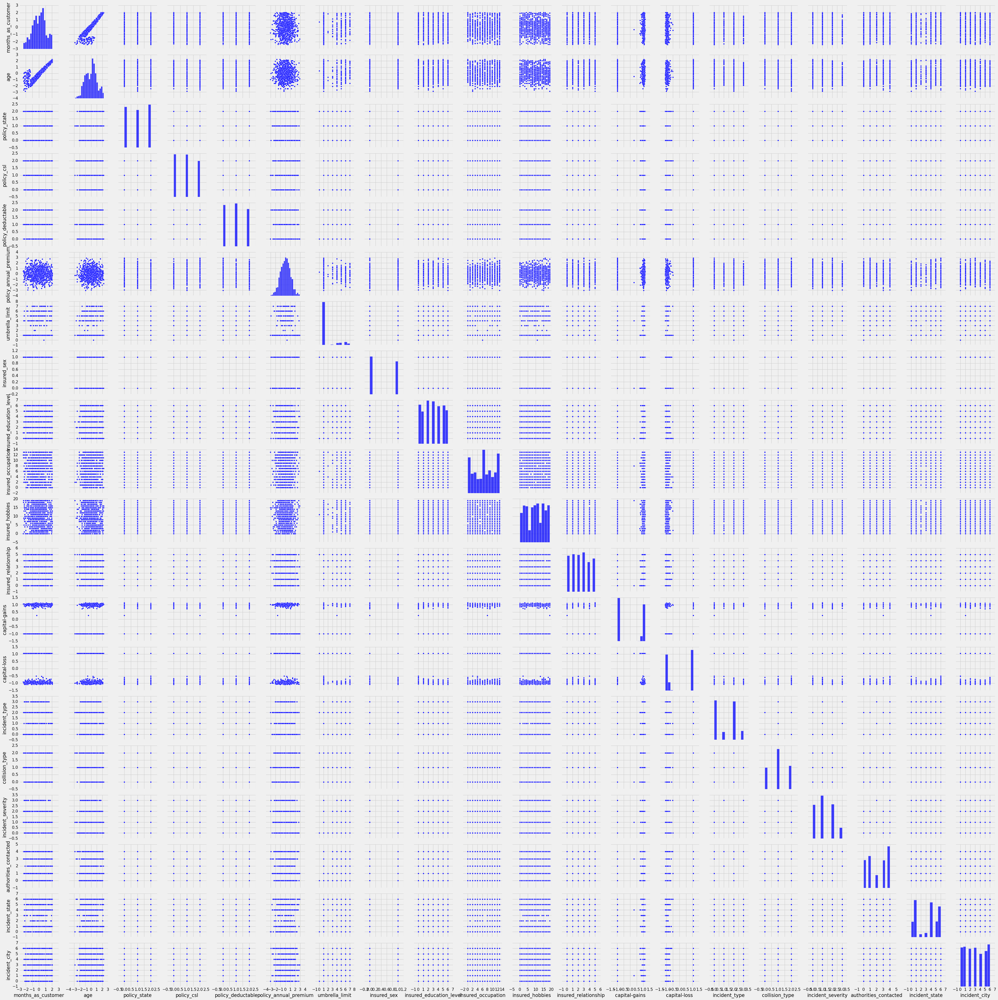

In [394]:
sb.pairplot(train.iloc[:,:20])

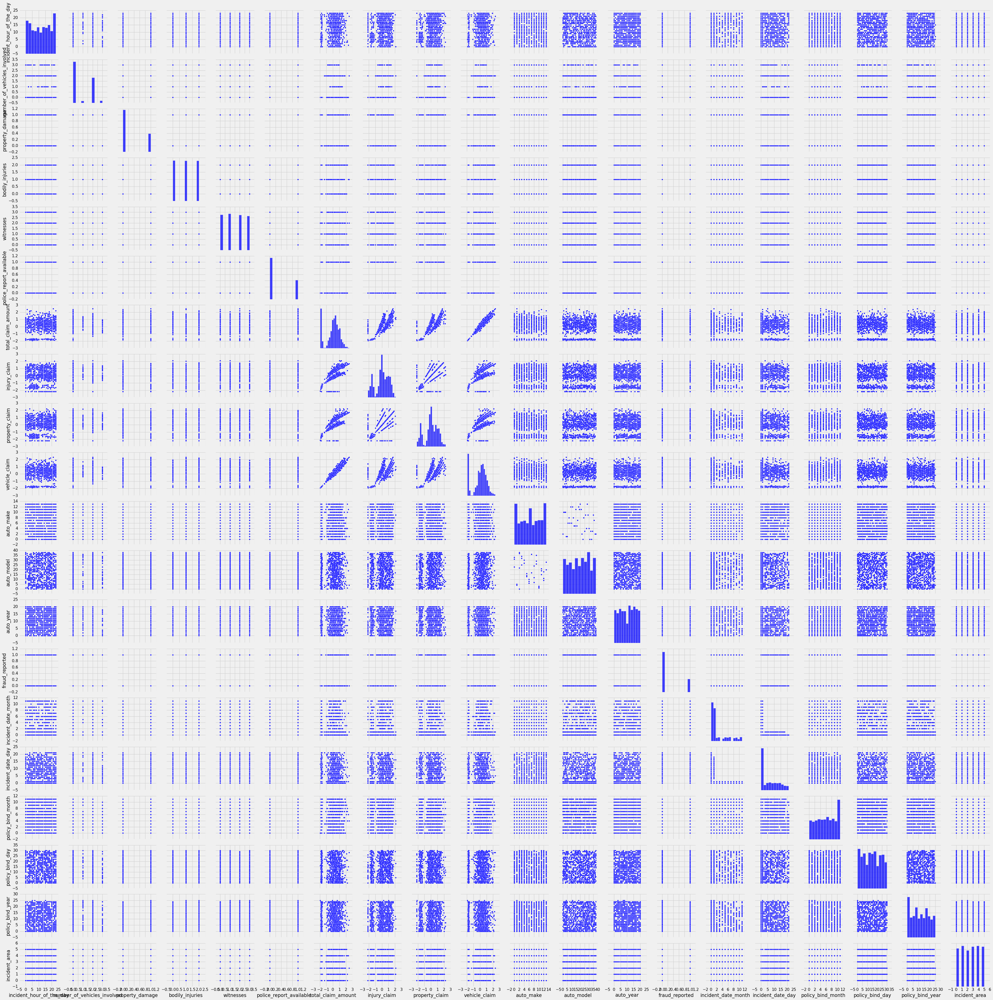

In [395]:
sb.pairplot(train.iloc[:,20:])

In [188]:
train

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,auto_make,auto_model,auto_year,fraud_reported,incident_date_month,incident_date_day,policy_bind_month,policy_bind_day,policy_bind_year,incident_area
0,1.044541,1.002330,2,1,1,0.623999,1,1,4,2,...,10,1,9,1,0,15,9,16,24,1
1,0.299045,0.427171,1,1,2,-0.241075,5,1,4,6,...,8,12,12,1,0,11,5,26,16,2
2,-0.515819,-1.136013,2,0,2,0.649541,5,0,6,11,...,4,30,12,0,1,12,5,8,10,3
3,0.517526,0.324015,0,1,2,0.660199,6,0,6,1,...,3,34,19,1,9,0,4,24,0,1
4,0.299045,0.626869,0,2,1,1.346451,6,1,0,11,...,0,31,14,0,1,7,5,5,24,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-2.293459,0.000032,2,2,1,0.228826,1,0,5,2,...,6,6,11,0,1,12,6,15,1,5
996,0.735268,0.324015,0,0,1,0.746426,1,0,6,9,...,13,28,20,0,0,14,4,0,24,1
997,-0.554272,-0.470598,2,1,0,0.527900,3,0,5,1,...,11,19,1,0,0,13,1,16,13,5
998,1.904088,2.121075,0,2,2,0.418724,5,1,0,5,...,1,5,3,0,1,16,10,17,21,3


PCA

In [396]:
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE

In [403]:
x = train.drop('fraud_reported',axis=1)
y = train['fraud_reported']

In [397]:
pca = PCA()

In [404]:
pca.fit(x,y)

PCA()

In [405]:
pca.explained_variance_ratio_

array([2.44445499e-01, 1.52589074e-01, 1.09258059e-01, 9.70774760e-02,
       8.75782921e-02, 7.06697615e-02, 6.26328062e-02, 3.26233495e-02,
       2.97325163e-02, 2.24614444e-02, 1.26640749e-02, 9.13499598e-03,
       8.17952986e-03, 8.03247412e-03, 6.76965039e-03, 6.05524234e-03,
       5.61175027e-03, 5.06582856e-03, 4.19082403e-03, 3.58648454e-03,
       3.31244306e-03, 2.41216690e-03, 2.04305296e-03, 1.91093879e-03,
       1.80573663e-03, 1.43128751e-03, 1.29053134e-03, 1.28164648e-03,
       1.22996635e-03, 1.18023848e-03, 9.54216629e-04, 6.58871468e-04,
       4.85436123e-04, 4.17015388e-04, 4.08943807e-04, 3.76579570e-04,
       2.19389779e-04, 2.17130293e-04, 5.27579006e-06])

<BarContainer object of 39 artists>

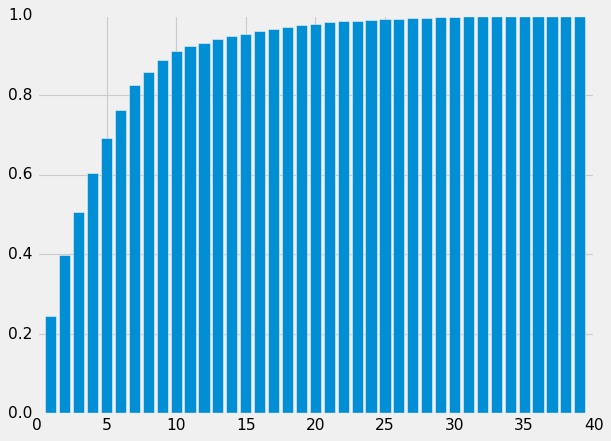

In [407]:
plt.bar(range(1,40),np.cumsum(pca.explained_variance_ratio_))


#### NOTE
    AS YOU CAN SEE, first 15-20 are giving upto 95% information about the data.

    AFTER TRYING MODELLING THE DATA WITH 25 components , model was underfitting.
###### DIMENTION REDUCTION IS CAUSING INFORMATION LOSS, Causing model to underperform, so are skipping the dimesion reduction step and choosing all the features for prediction

In [426]:
X_over,Y_over = SMOTE().fit_resample(x,y)

### DATA MODELLING
    - AS i balanced classes present we need to check for f1 score, precision score, recall score.
    
    - Evalution metrics choose: ACCuracy SCORE.

In [415]:
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

import scikitplot as skplt
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, plot_roc_curve,plot_precision_recall_curve
from sklearn.metrics import roc_auc_score,roc_curve,f1_score,recall_score,precision_score

In [433]:
#function to find best random state for any model

def random_state_func(model):
    randomstate = 0
    max_score = 0
    
    for i in range(1,200):
        x_train,x_test,y_train,y_test = train_test_split(X_over,Y_over,test_size=.30,random_state=i)
        model.fit(x_train,y_train)
        pred = model.predict(x_test)
        score = accuracy_score(y_test,pred)    
        if(score>max_score):
            max_score = score
            randomstate  = i
    return(randomstate,max_score)

In [431]:
random_state_func(LogisticRegression())

(187, 0.8445945945945946)

In [435]:
cv_scores = []
auc_roc_scores = []
acc_scores = []
f1_scores = []

In [436]:
X_over.shape

(1480, 39)

In [437]:
# Method to for algorithm prediction for any model.


plt.style.use('classic')

def model_predict(model,randomstate):
    x_train,x_test,y_train,y_test = train_test_split(X_over,Y_over,test_size=.33,random_state=randomstate)
    model.fit(x_train,y_train)
    predictions = model.predict(x_test)
    pred_proba = model.predict_proba(x_test)[:,1]
    fpr,tpr,threshold = roc_curve(y_test,pred_proba)
    cv_score = np.mean(cross_val_score(model,X_over,Y_over,cv=5,scoring='accuracy'))
     
    print('------------',model,'--------------')
    print(' Accuracy Score         : ', accuracy_score(y_test,predictions))
    print('ROC AUC Score           : ', roc_auc_score(y_test,pred_proba))
    print('Cross Validation Score  : ',cv_score)
    print('F1 Score                :',f1_score(y_test,predictions))
   
   
    
    
    print(classification_report(y_test,predictions))
    acc_scores.append(accuracy_score(y_test,predictions))
    cv_scores.append(cv_score)
    auc_roc_scores.append(roc_auc_score(y_test,pred_proba))
    f1_scores.append(f1_score(y_test,predictions))
    
    
    plt.figure(figsize=(6,5))
    auc_roc_curve_plot = plot_roc_curve(model, x_test, y_test)
    plt.plot([0, 1], [0, 1], linestyle='--', color='r')
    plt.show()
    
    skplt.metrics.plot_confusion_matrix(y_test,predictions,figsize=(4,3))
    plt.show()
    
    
    
    

In [438]:
 x_train,x_test,y_train,y_test = train_test_split(X_over,Y_over,test_size=.33,random_state=44)
   

#### LOGISTIC REGRESSION

Random STate choosen is:  187 with its MAX Accuracy Score 0.8445945945945946
------------ LogisticRegression() --------------
 Accuracy Score         :  0.8323108384458078
ROC AUC Score           :  0.8982323232323232
Cross Validation Score  :  0.7905405405405406
F1 Score                : 0.8373015873015872
              precision    recall  f1-score   support

           0       0.79      0.87      0.83       225
           1       0.88      0.80      0.84       264

    accuracy                           0.83       489
   macro avg       0.83      0.84      0.83       489
weighted avg       0.84      0.83      0.83       489



<Figure size 480x400 with 0 Axes>

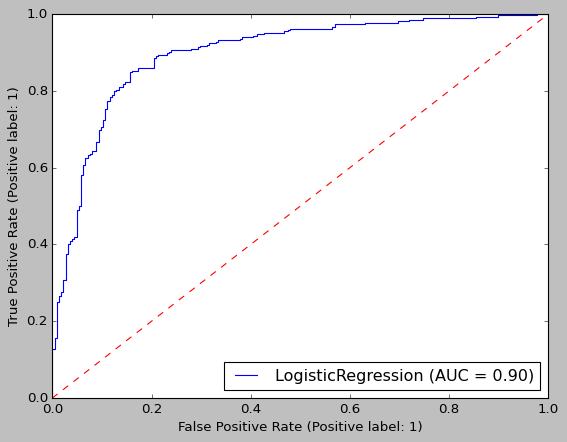

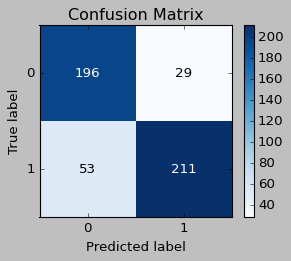

In [439]:

randomstate,ms = random_state_func(LogisticRegression())
print('Random STate choosen is: ',randomstate,'with its MAX Accuracy Score',ms)
model_predict(LogisticRegression(),randomstate)

#### SVC

In [440]:
grid.best_estimator_,grid.best_score_

(LGBMClassifier(bagging_fraction=0.75, bagging_freq=7, max_depth=10,
                num_leaves=40),
 0.8778945231206536)

Random STate choosen is:  31 with its MAX Accuracy Score 0.8018018018018018
------------ SVC(probability=True) --------------
 Accuracy Score         :  0.7934560327198364
ROC AUC Score           :  0.8518518518518519
Cross Validation Score  :  0.7608108108108108
F1 Score                : 0.8031189083820662
              precision    recall  f1-score   support

           0       0.83      0.74      0.78       246
           1       0.76      0.85      0.80       243

    accuracy                           0.79       489
   macro avg       0.80      0.79      0.79       489
weighted avg       0.80      0.79      0.79       489



<Figure size 480x400 with 0 Axes>

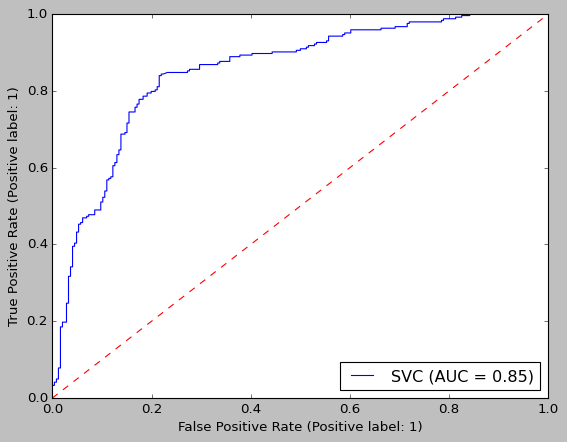

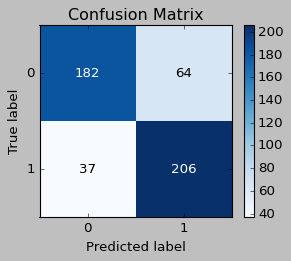

In [441]:

randomstate,ms = random_state_func(SVC())
print('Random STate choosen is: ',randomstate,'with its MAX Accuracy Score',ms)
model_predict(SVC(probability=True),randomstate)

------------ KNeighborsClassifier(n_neighbors=6) --------------
 Accuracy Score         :  0.7443762781186094
ROC AUC Score           :  0.8122594043357871
Cross Validation Score  :  0.7216216216216216
F1 Score                : 0.7863247863247863
              precision    recall  f1-score   support

           0       0.78      0.61      0.68       221
           1       0.73      0.86      0.79       268

    accuracy                           0.74       489
   macro avg       0.75      0.73      0.73       489
weighted avg       0.75      0.74      0.74       489



<Figure size 480x400 with 0 Axes>

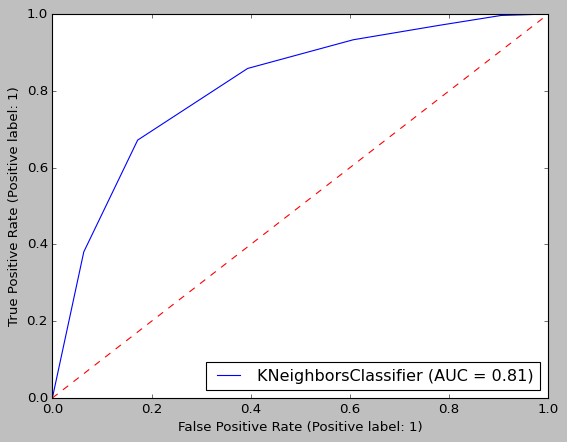

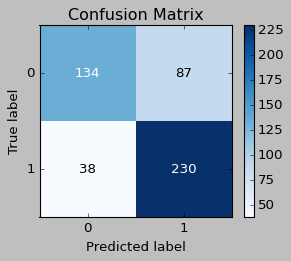

In [442]:
rs,max_score = random_state_func(KNeighborsClassifier())
model_predict(KNeighborsClassifier(n_neighbors=6),rs)

#### KNN DOESNOT WORK WELL WITH HIGH NO OF FEATURES.
#### SVC might be prone to overfit.

Random STate choosen is:  143 with its MAX Accuracy Score 0.8581081081081081
------------ DecisionTreeClassifier() --------------
 Accuracy Score         :  0.8159509202453987
ROC AUC Score           :  0.8153861665658398
Cross Validation Score  :  0.8027027027027026
F1 Score                : 0.8034934497816594
              precision    recall  f1-score   support

           0       0.83      0.82      0.83       261
           1       0.80      0.81      0.80       228

    accuracy                           0.82       489
   macro avg       0.82      0.82      0.82       489
weighted avg       0.82      0.82      0.82       489



<Figure size 480x400 with 0 Axes>

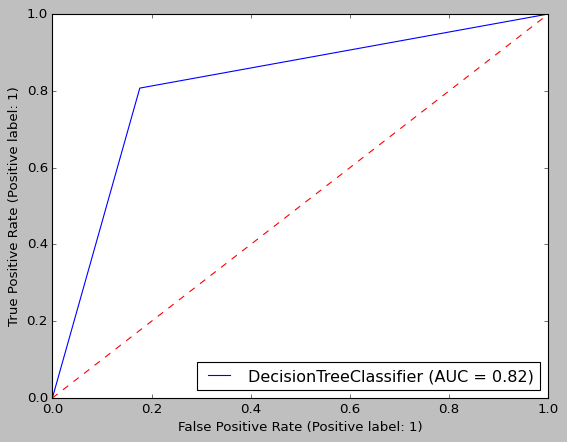

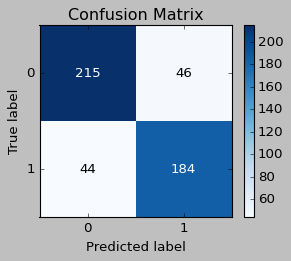

In [443]:

randomstate,ms = random_state_func(DecisionTreeClassifier())
print('Random STate choosen is: ',randomstate,'with its MAX Accuracy Score',ms)
model_predict(DecisionTreeClassifier(),randomstate)

#### ENSEMBLING TECHNIQUES:
    - Random Forest
    - XGBClassifer
    - LightGBM

Random STate choosen is:  114 with its MAX Accuracy Score 0.9099099099099099
------------ RandomForestClassifier(max_depth=30, n_estimators=150) --------------
 Accuracy Score         :  0.8895705521472392
ROC AUC Score           :  0.9561471021282292
Cross Validation Score  :  0.8716216216216216
F1 Score                : 0.8919999999999999
              precision    recall  f1-score   support

           0       0.89      0.88      0.89       241
           1       0.88      0.90      0.89       248

    accuracy                           0.89       489
   macro avg       0.89      0.89      0.89       489
weighted avg       0.89      0.89      0.89       489



<Figure size 480x400 with 0 Axes>

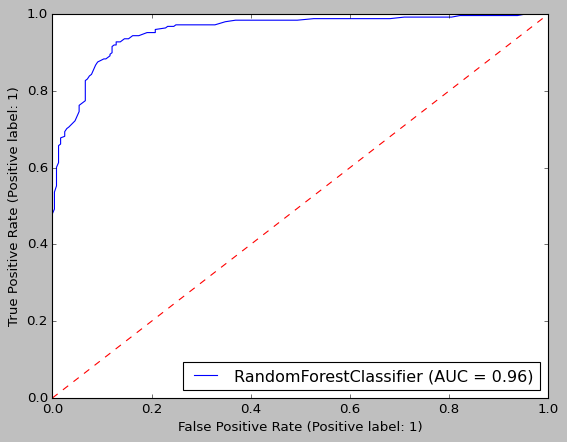

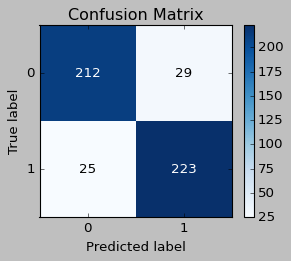

In [444]:

randomstate,ms = random_state_func(RandomForestClassifier())
print('Random STate choosen is: ',randomstate,'with its MAX Accuracy Score',ms)
model_predict(RandomForestClassifier(n_estimators=150,max_depth=30),randomstate)

[22:25:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:25:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:25:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:25:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

<Figure size 480x400 with 0 Axes>

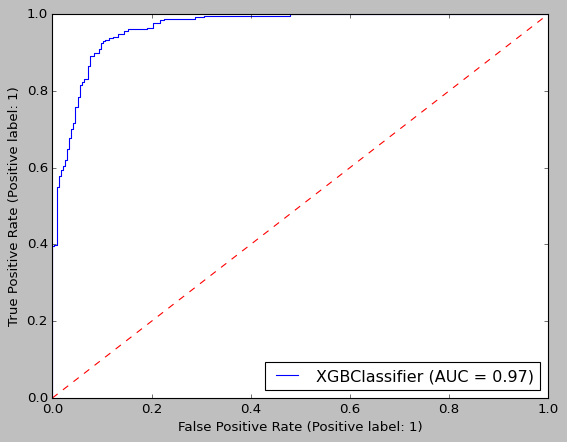

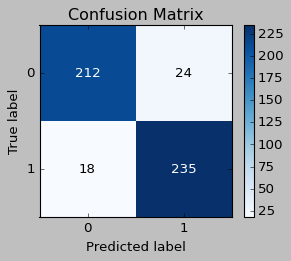

In [445]:

randomstate,ms = random_state_func(XGBClassifier())
print('Random STate choosen is: ',randomstate,'with its MAX Accuracy Score',ms)
model_predict(XGBClassifier(),randomstate)

Random STate choosen is:  177 with its MAX Accuracy Score 0.9279279279279279
[22:26:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:26:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:26:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old beh

<Figure size 480x400 with 0 Axes>

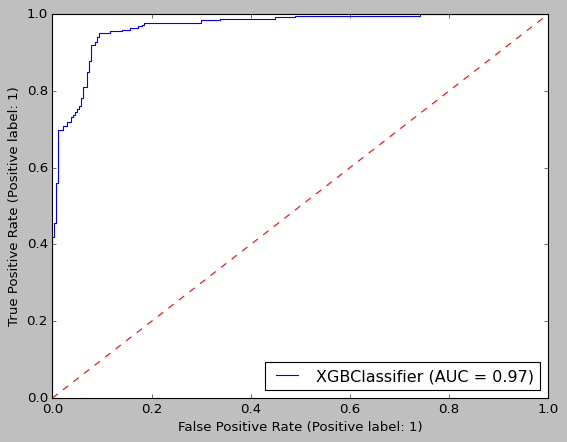

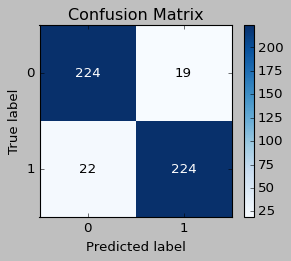

In [446]:

randomstate,ms = random_state_func(LGBMClassifier())
print('Random STate choosen is: ',randomstate,'with its MAX Accuracy Score',ms)
model_predict(XGBClassifier(),randomstate)

In [447]:
error = []
for i in range(0,7):
    error.append(np.abs(acc_scores[i] - cv_scores[i]))
    

In [448]:
table_dict = {
    'ROC AUC SCORE: ':auc_roc_scores,
    'ACCURACY SCORE': acc_scores,
    'CV SCORE': cv_scores,
    'F1 SCORE': f1_scores,
    'Bias/ Error': error
}

In [449]:
score_table = pd.DataFrame(table_dict,index=['LogReg','SVC','KNN','DTC','RF','XGB','LGBM'])

In [450]:
score_table

,ROC AUC SCORE:,ACCURACY SCORE,CV SCORE,F1 SCORE,Bias/ Error
LogReg,0.898232,0.832311,0.790541,0.837302,0.041770
SVC,0.851852,0.793456,0.760811,0.803119,0.032645
KNN,0.812259,0.744376,0.721622,0.786325,0.022755
DTC,0.815386,0.815951,0.802703,0.803493,0.013248
RF,0.956147,0.889571,0.871622,0.892000,0.017949
XGB,0.965934,0.914110,0.876351,0.917969,0.037759
LGBM,0.966409,0.916155,0.876351,0.916155,0.039804


#### OBSERVATIONS:
    - as all the other models have same error of around 0.03 - 0.24.
    - Lowest Error for ensembling technique Random forest
    - EValuation Metric for this case study will be Accuracy Score And F1 Score  as imblanced classes present so we need to check for biasness  in results towards majority or minority class.

#### HYPER PARAMETER TUNING OF ENSEMBLING TECHNIQUE

### TUNING RANDOM FOREST

In [291]:
params = {
    'criterion' : ['entropy','gini'],
    'n_estimators': [50,100,120,70],
    'max_depth': [15,20,30,35],
     'min_samples_leaf':[1,2,5,10],
    'min_samples_split':[3,4,5,6],
    
    'max_leaf_nodes':[None,20,50,70,80,100],
    
    
}
grid= RandomizedSearchCV(RandomForestClassifier(),params,n_iter=50,scoring='accuracy',cv=5,verbose=2)



In [292]:
grid.fit(X_over,Y_over)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END criterion=entropy, max_depth=30, max_leaf_nodes=50, min_samples_leaf=2, min_samples_split=4, n_estimators=70; total time=   0.1s
[CV] END criterion=entropy, max_depth=30, max_leaf_nodes=50, min_samples_leaf=2, min_samples_split=4, n_estimators=70; total time=   0.1s
[CV] END criterion=entropy, max_depth=30, max_leaf_nodes=50, min_samples_leaf=2, min_samples_split=4, n_estimators=70; total time=   0.1s
[CV] END criterion=entropy, max_depth=30, max_leaf_nodes=50, min_samples_leaf=2, min_samples_split=4, n_estimators=70; total time=   0.1s
[CV] END criterion=entropy, max_depth=30, max_leaf_nodes=50, min_samples_leaf=2, min_samples_split=4, n_estimators=70; total time=   0.1s
[CV] END criterion=gini, max_depth=30, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=4, n_estimators=120; total time=   0.2s
[CV] END criterion=gini, max_depth=30, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=4, n_estimat

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=50,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [15, 20, 30, 35],
                                        'max_leaf_nodes': [None, 20, 50, 70, 80,
                                                           100],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [3, 4, 5, 6],
                                        'n_estimators': [50, 100, 120, 70]},
                   scoring='accuracy', verbose=2)

In [293]:
grid.best_estimator_, grid.best_score_

(RandomForestClassifier(max_depth=20, min_samples_leaf=2, min_samples_split=5,
                        n_estimators=120),
 0.8648648648648649)

Random STate choosen is:  22 with its MAX Accuracy Score 0.9009009009009009
------------ RandomForestClassifier(max_depth=20, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=120) --------------
 Accuracy Score         :  0.9079754601226994
ROC AUC Score           :  0.9632446452476573
Cross Validation Score  :  0.8554054054054054
F1 Score                : 0.9105367793240556
              precision    recall  f1-score   support

           0       0.91      0.90      0.91       240
           1       0.90      0.92      0.91       249

    accuracy                           0.91       489
   macro avg       0.91      0.91      0.91       489
weighted avg       0.91      0.91      0.91       489



<Figure size 480x400 with 0 Axes>

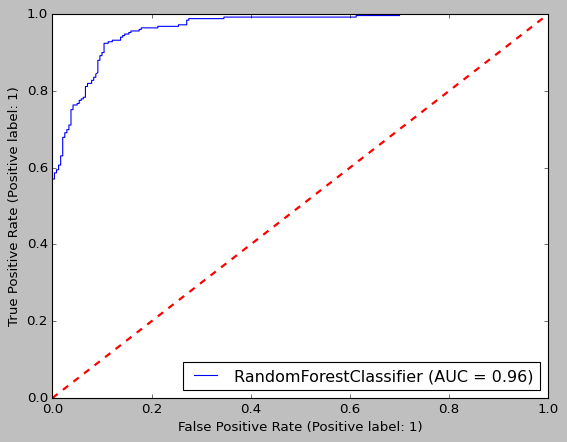

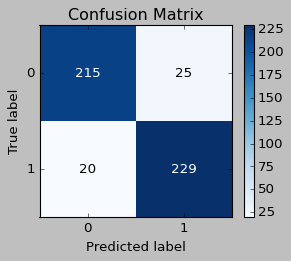

In [294]:

randomstate,ms = random_state_func(RandomForestClassifier())
print('Random STate choosen is: ',randomstate,'with its MAX Accuracy Score',ms)
model_predict(RandomForestClassifier(max_depth=20, min_samples_leaf=2, min_samples_split=5,
                        n_estimators=120),randomstate)

#### Tuning LIGHT GBM

In [305]:
params = {
     'num_leaves': [70,80,50,40,20],
    'max_depth': [5,7,10,12,15],
   
    'bagging_freq': [5,10,15,7,12], 
    "bagging_fraction": [0.75,.6,.5,.8,.85,.7],
    'learning_rate': [.01,.02,.1,.5]
    
    
}
grid= RandomizedSearchCV(LGBMClassifier(),params,n_iter=100,scoring='accuracy',cv=5,verbose=2)



In [306]:
grid.fit(x_train,y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END bagging_fraction=0.85, bagging_freq=5, learning_rate=0.1, max_depth=12, num_leaves=80; total time=   0.0s
[LightGBM] [Warning] bagging_fraction is set=0.85, subsample=1.0 will be ignored. Current value: bagging_fraction=0.85
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[CV] END bagging_fraction=0.85, bagging_freq=5, learning_rate=0.1, max_depth=12, num_leaves=80; total time=   0.0s
[LightGBM] [Warning] bagging_fraction is set=0.85, subsample=1.0 will be ignored. Current value: bagging_fraction=0.85
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[CV] END bagging_fraction=0.85, bagging_freq=5, learning_rate=0.1, max_depth=12, num_leaves=80; total time=   0.0s
[LightGBM] [Warning] bagging_fraction is set=0.85, subsample=1.0 will be ignored. Current value: bagging_fraction=0.85
[LightGBM] [Warning

RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_iter=100,
                   param_distributions={'bagging_fraction': [0.75, 0.6, 0.5,
                                                             0.8, 0.85, 0.7],
                                        'bagging_freq': [5, 10, 15, 7, 12],
                                        'learning_rate': [0.01, 0.02, 0.1, 0.5],
                                        'max_depth': [5, 7, 10, 12, 15],
                                        'num_leaves': [70, 80, 50, 40, 20]},
                   scoring='accuracy', verbose=2)

In [307]:
grid.best_estimator_,grid.best_score_

(LGBMClassifier(bagging_fraction=0.75, bagging_freq=7, max_depth=10,
                num_leaves=40),
 0.8778945231206536)

Random STate choosen is:  23 with its MAX Accuracy Score 0.9234234234234234
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warn

<Figure size 480x400 with 0 Axes>

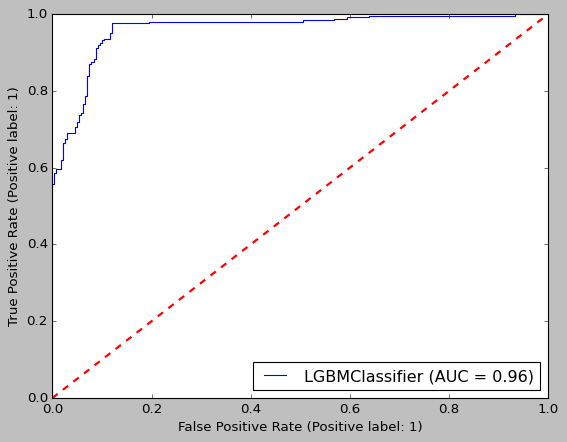

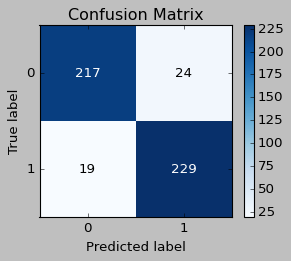

In [310]:

randomstate,ms = random_state_func(LGBMClassifier())
print('Random STate choosen is: ',randomstate,'with its MAX Accuracy Score',ms)
model_predict(LGBMClassifier(bagging_fraction=0.75, bagging_freq=7, max_depth=10,
                num_leaves=40),randomstate)

#### AS LightGBM has lower number FP, FN than Random FOrest, and Accuracy Score and F1 score of LightGM is better than Random Forest, 
    - WE CHOOSE OUR TUNED MODEL LightGM

### EVAULATING LIGHTGM

In [320]:
    x_train,x_test,y_train,y_test = train_test_split(X_over,Y_over,test_size=.33,random_state=23)
    model = LGBMClassifier(bagging_fraction=0.75, bagging_freq=7, max_depth=10,
                num_leaves=40)
    model.fit(x_train,y_train)
    predictions = model.predict(x_test)
    pred_proba = model.predict_proba(x_test)[:,1]
    fpr,tpr,threshold = roc_curve(y_test,pred_proba)
    cv_score = np.mean(cross_val_score(model,X_over,Y_over,cv=5,scoring='accuracy'))
     
    print('---------------------',model,'---------------------------')
    print(' Accuracy Score         : ', accuracy_score(y_test,predictions))
    print('ROC AUC Score           : ', roc_auc_score(y_test,pred_proba))
    print('Cross Validation Score  : ',cv_score)
    print('F1 Score                :',f1_score(y_test,predictions))
   
   
    
  

[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.75, subsample=1.0 will be ignored. Current va

              precision    recall  f1-score   support

           0       0.92      0.90      0.91       241
           1       0.91      0.92      0.91       248

    accuracy                           0.91       489
   macro avg       0.91      0.91      0.91       489
weighted avg       0.91      0.91      0.91       489



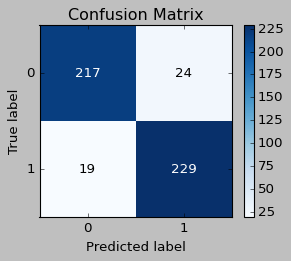

In [322]:
print(classification_report(y_test,predictions))
    

skplt.metrics.plot_confusion_matrix(y_test,predictions,figsize=(4,3))
plt.show()

<Figure size 480x400 with 0 Axes>

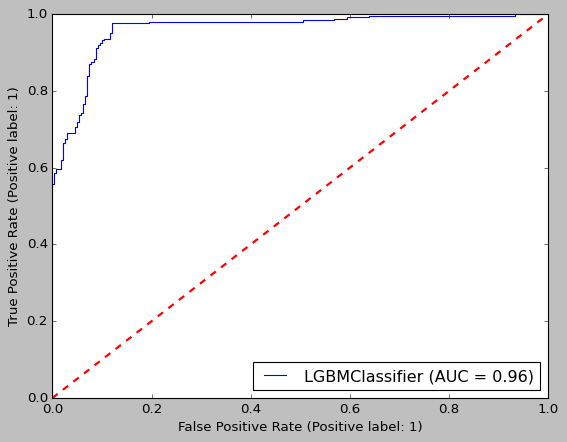

In [323]:
    # AUC ROC CURVE 
    plt.figure(figsize=(6,5))
    auc_roc_curve_plot = plot_roc_curve(model, x_test, y_test)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random guess')
    plt.show()

### AS WE CAN SEE: 
    - F1 score, precision and recall are good and higth for both the classes.
    - Accuracy score of .91% is obtained after hypertuning model.
    - Roc Auc Score is .96
    - No biassness towards any class present, less chance of overfitting as validation and trainnig score both are high.

#### Import joblib for SAVING THR MODEL

In [324]:
import joblib

In [327]:
joblib.dump(model,'insurance_fraud_lightGM.pk1')

['insurance_fraud_lightGM.pk1']

In [328]:
joblib.load('insurance_fraud_lightGM.pk1')

LGBMClassifier(bagging_fraction=0.75, bagging_freq=7, max_depth=10,
               num_leaves=40)